## Deep Learning for Image classification (using MLP)

In [56]:
# installing dependencies
import os
from pathlib import Path 
from keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

In [57]:
p = Path("crop_images/")
dirs = p.glob("*")

crop_image_data = []
labels = []
label2img = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
label_dict = {"jute":0,"maize":1,"rice":2,"sugarcane":3,"wheat":4}

for folder_dir in dirs:
    label = str(folder_dir).split("\\")[-1]

    cnt = 0
    #print(folder_dir)

    for img_path in folder_dir.glob("*jpeg"):
        #print(img_path)
        img = image.load_img(img_path,target_size=(100,100))
        img_array = image.img_to_array(img)
        crop_image_data.append(img_array)

        labels.append(label_dict[label])
        cnt+=1
    print(cnt)    

160
160
160
160
164


In [58]:
#visualisation
print(len(crop_image_data))
print(len(labels))
#print(labels)

X = np.array(crop_image_data)
Y = np.array(labels)
#print(X.shape,Y.shape)

from sklearn.utils import shuffle
X,Y = shuffle(X,Y,random_state=2)
X = X/255.0 #normalisation

def drawImg(img,label):
    plt.title(label2img[label])
    plt.imshow(img)
    plt.axis("off")
    plt.show()

804
804


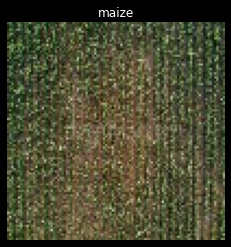

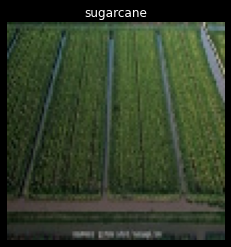

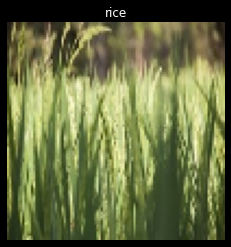

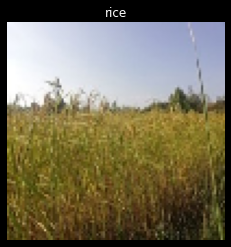

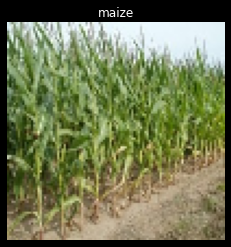

...

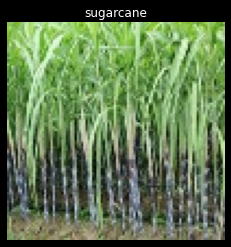

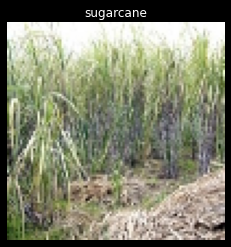

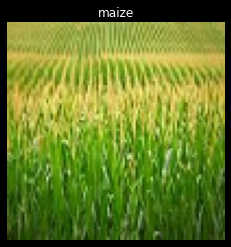

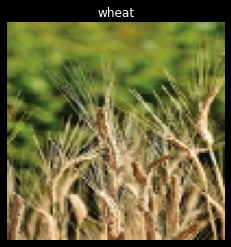

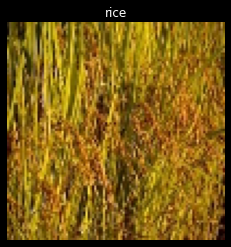

In [59]:
for i in range(1,50):
    r = np.random.randint(400)
    drawImg(X[r],Y[r])

In [60]:
# training and testing splitting
split = int(X.shape[0]*0.7)

X_ = np.array(X)
Y_ = np.array(Y)

#Training Set
X = X_[:split,:]
Y = Y_[:split]

#Test Set
XTest = X_[split:,:]
YTest = Y_[split:]

print(X.shape,Y.shape)
print(XTest.shape,YTest.shape)

(562, 100, 100, 3) (562,)
(242, 100, 100, 3) (242,)


In [61]:
class NeuralNetwork:
    
    def __init__(self,input_size,layers,output_size):
        np.random.seed(0)
        
        model = {} #Dictionary
        
        #First Layer
        model['W1'] = np.random.randn(input_size,layers[0])
        model['b1'] = np.zeros((1,layers[0]))
        
        #Second Layer
        model['W2'] = np.random.randn(layers[0],layers[1])
        model['b2'] = np.zeros((1,layers[1]))
        
        #Third/Output Layer
        model['W3'] = np.random.randn(layers[1],output_size)
        model['b3'] = np.zeros((1,output_size))
        
        self.model = model
        self.activation_outputs = None
    
    def forward(self,x):
        
        W1,W2,W3 = self.model['W1'],self.model['W2'],self.model['W3']
        b1, b2, b3 = self.model['b1'],self.model['b2'],self.model['b3']
        
        z1 = np.dot(x,W1) + b1
        a1 = np.tanh(z1) 
        
        z2 = np.dot(a1,W2) + b2
        a2 = np.tanh(z2)
        
        z3 = np.dot(a2,W3) + b3
        y_ = softmax(z3)
        
        self.activation_outputs = (a1,a2,y_)
        return y_
        
    def backward(self,x,y,learning_rate=0.001):
        W1,W2,W3 = self.model['W1'],self.model['W2'],self.model['W3']
        b1, b2, b3 = self.model['b1'],self.model['b2'],self.model['b3']
        m = x.shape[0]
        
        a1,a2,y_ = self.activation_outputs
        
        delta3 = y_ - y
        dw3 = np.dot(a2.T,delta3)
        db3 = np.sum(delta3,axis=0)
        
        delta2 = (1-np.square(a2))*np.dot(delta3,W3.T)
        dw2 = np.dot(a1.T,delta2)
        db2 = np.sum(delta2,axis=0)
        
        delta1 = (1-np.square(a1))*np.dot(delta2,W2.T)
        dw1 = np.dot(X.T,delta1)
        db1 = np.sum(delta1,axis=0)
        
        
        #Update the Model Parameters using Gradient Descent
        self.model["W1"]  -= learning_rate*dw1
        self.model['b1']  -= learning_rate*db1
        
        self.model["W2"]  -= learning_rate*dw2
        self.model['b2']  -= learning_rate*db2
        
        self.model["W3"]  -= learning_rate*dw3
        self.model['b3']  -= learning_rate*db3
        
        # :)
        
    def predict(self,x):
        y_out = self.forward(x)
        return np.argmax(y_out,axis=1)
    
    def summary(self):
        W1,W2,W3 = self.model['W1'],self.model['W2'],self.model['W3']
        a1,a2,y_ = self.activation_outputs
        
        print("W1 ",W1.shape)
        print("A1 ",a1.shape)

def softmax(a):
    e_pa = np.exp(a) #Vector
    ans = e_pa/np.sum(e_pa,axis=1,keepdims=True)
    return ans      

In [62]:
def loss(y_oht,p):
    l = -np.mean(y_oht*np.log(p))
    return l

def one_hot(y,depth):
    
    m = y.shape[0]
    y_oht = np.zeros((m,depth))
    y_oht[np.arange(m),y] = 1
    return y_oht

In [63]:
def train(X,Y,model,epochs,learning_rate,logs=True):
    training_loss = []
    
    classes = 5
    Y_OHT = one_hot(Y,classes)
    
    for ix in range(epochs):
        
        Y_ = model.forward(X)
        l = loss(Y_OHT,Y_)
        
        model.backward(X,Y_OHT,learning_rate)
        training_loss.append(l)
        #if(logs and ix%50==0):
        print("Epoch %d Loss %.4f"%(ix,l))
            
            
    
    return training_loss

In [64]:
model = NeuralNetwork(input_size=30000,layers=[100,50],output_size=5)

In [65]:
print(X.shape)

(562, 100, 100, 3)


In [66]:
X = X.reshape(X.shape[0],-1)
print(X.shape)

XTest = XTest.reshape(XTest.shape[0],-1)
print(XTest.shape)

(562, 30000)
(242, 30000)


In [68]:
l = train(X,Y,model,500,0.0001)

Epoch 0 Loss 0.3924
Epoch 1 Loss 0.3966
Epoch 2 Loss 0.3725
Epoch 3 Loss 0.3757
Epoch 4 Loss 0.3534
Epoch 5 Loss 0.3587
Epoch 6 Loss 0.3448
Epoch 7 Loss 0.3515
Epoch 8 Loss 0.3556
Epoch 9 Loss 0.3290
Epoch 10 Loss 0.3474
Epoch 11 Loss 0.3218
Epoch 12 Loss 0.3394
Epoch 13 Loss 0.3113
Epoch 14 Loss 0.3187
Epoch 15 Loss 0.3219
Epoch 16 Loss 0.3072
Epoch 17 Loss 0.2903
Epoch 18 Loss 0.2967
Epoch 19 Loss 0.2920
Epoch 20 Loss 0.2751
Epoch 21 Loss 0.2820
Epoch 22 Loss 0.2768
Epoch 23 Loss 0.2774
Epoch 24 Loss 0.2729
Epoch 25 Loss 0.2786
Epoch 26 Loss 0.2663
Epoch 27 Loss 0.2592
Epoch 28 Loss 0.2473
Epoch 29 Loss 0.2562
Epoch 30 Loss 0.2545
Epoch 31 Loss 0.2533
Epoch 32 Loss 0.2466
Epoch 33 Loss 0.2443
Epoch 34 Loss 0.2445
Epoch 35 Loss 0.2570
Epoch 36 Loss 0.2417
Epoch 37 Loss 0.2304
Epoch 38 Loss 0.2346
Epoch 39 Loss 0.2296
Epoch 40 Loss 0.2380
Epoch 41 Loss 0.2334
Epoch 42 Loss 0.2126
Epoch 43 Loss 0.2115
Epoch 44 Loss 0.2187
Epoch 45 Loss 0.2234
Epoch 46 Loss 0.2185
Epoch 47 Loss 0.2300
Ep

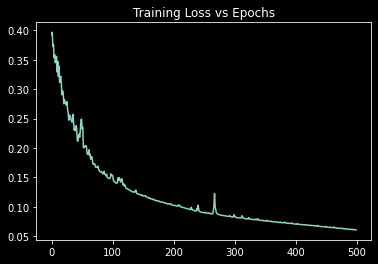

In [69]:
from matplotlib import pyplot as plt
plt.style.use("dark_background")
plt.title("Training Loss vs Epochs")
plt.plot(l)

plt.show()

In [70]:
# Accuracy 
def getAccuracy(X,Y,model):
    outputs = model.predict(X)
    acc = np.sum(outputs==Y)/Y.shape[0]
    return acc
    
print("Train Acc %.4f"%getAccuracy(X,Y,model))
print("Test Acc %.4f"%getAccuracy(XTest,YTest,model))

Train Acc 0.9306
Test Acc 0.6281


In [71]:
from sklearn.metrics import classification_report

In [72]:
print(classification_report(model.predict(X),Y))

              precision    recall  f1-score   support

           0       0.89      0.89      0.89       104
           1       0.93      0.95      0.94       120
           2       0.92      0.90      0.91       115
           3       0.95      0.92      0.93       114
           4       0.96      0.98      0.97       109

    accuracy                           0.93       562
   macro avg       0.93      0.93      0.93       562
weighted avg       0.93      0.93      0.93       562



In [73]:
print(classification_report(model.predict(XTest),YTest))

              precision    recall  f1-score   support

           0       0.56      0.62      0.59        50
           1       0.63      0.60      0.62        40
           2       0.64      0.70      0.67        43
           3       0.67      0.60      0.63        55
           4       0.64      0.63      0.64        54

    accuracy                           0.63       242
   macro avg       0.63      0.63      0.63       242
weighted avg       0.63      0.63      0.63       242



In [74]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

In [75]:
cnf_matrix = confusion_matrix(model.predict(X),Y)
print(cnf_matrix)

[[ 93   5   4   2   0]
 [  2 114   2   2   0]
 [  5   2 104   2   2]
 [  5   0   2 105   2]
 [  0   1   1   0 107]]


In [76]:
cnf_matrix = confusion_matrix(model.predict(XTest),YTest)
print(cnf_matrix)

[[31  3  4  7  5]
 [ 4 24  4  4  4]
 [ 5  2 30  1  5]
 [ 8  4  5 33  5]
 [ 7  5  4  4 34]]


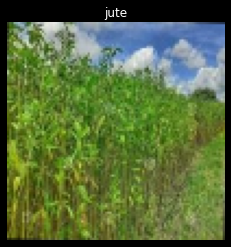

Prediction 8 sugarcane


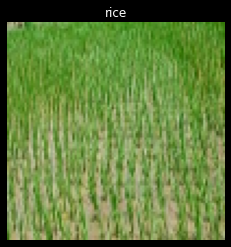

Prediction 36 jute


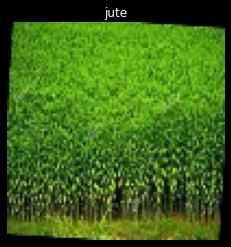

Prediction 42 rice


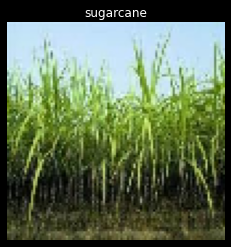

Prediction 81 maize


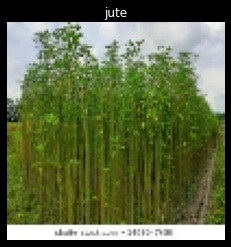

Prediction 91 rice


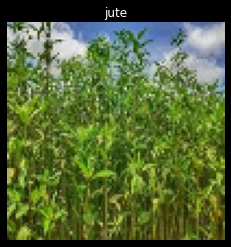

Prediction 102 sugarcane


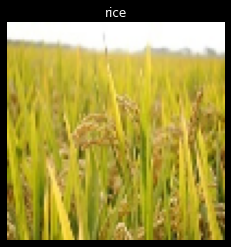

Prediction 114 jute


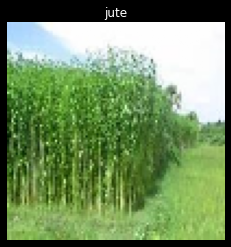

Prediction 118 sugarcane


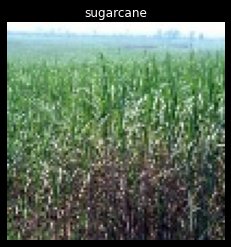

Prediction 120 jute


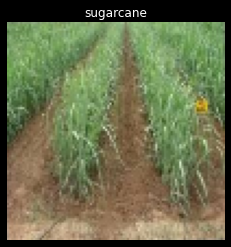

Prediction 144 rice


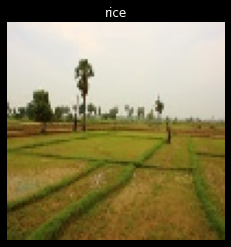

Prediction 153 jute


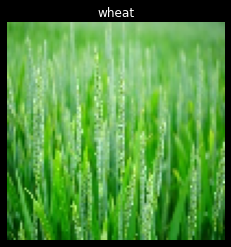

Prediction 163 sugarcane


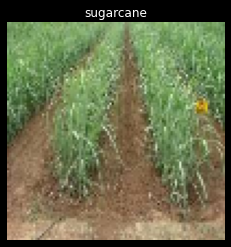

Prediction 183 jute


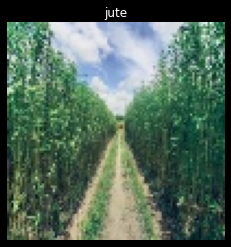

Prediction 186 maize


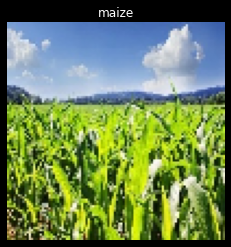

Prediction 194 jute


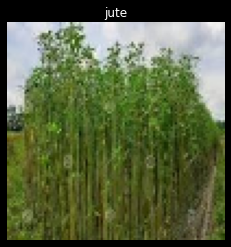

Prediction 223 rice


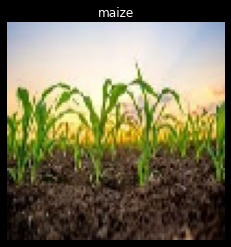

Prediction 242 wheat


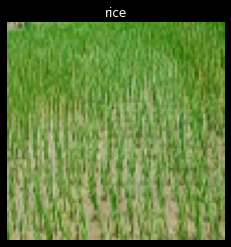

Prediction 257 jute


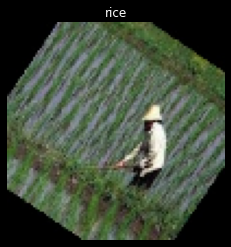

Prediction 267 wheat


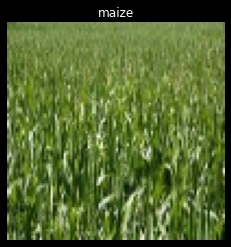

Prediction 280 jute


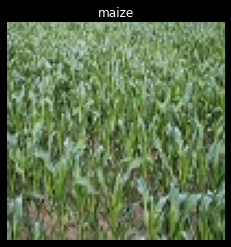

Prediction 287 jute


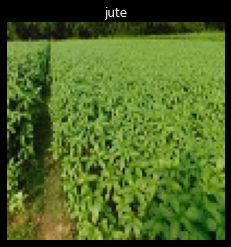

Prediction 292 rice


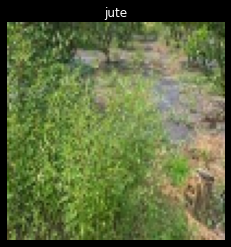

Prediction 298 sugarcane


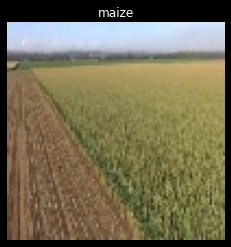

Prediction 308 jute


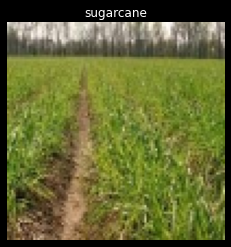

Prediction 326 rice


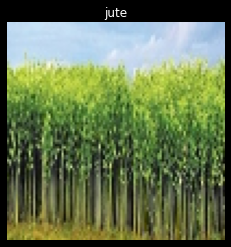

Prediction 333 sugarcane


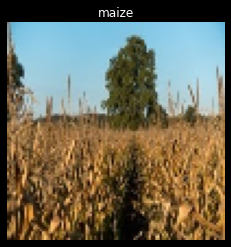

Prediction 335 rice


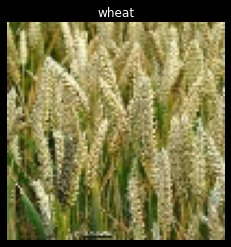

Prediction 358 sugarcane


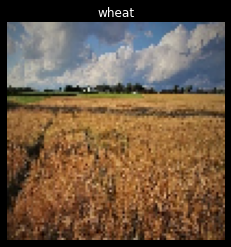

Prediction 360 rice


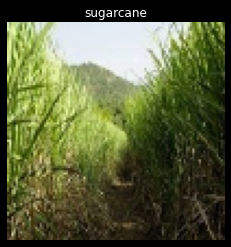

Prediction 393 maize


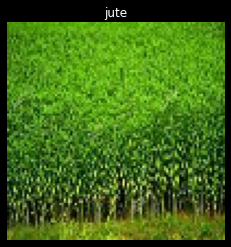

Prediction 422 maize


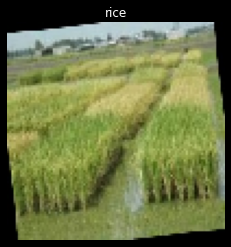

Prediction 441 maize


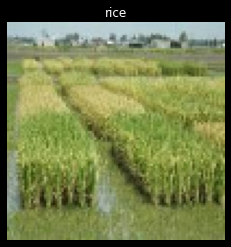

Prediction 464 sugarcane


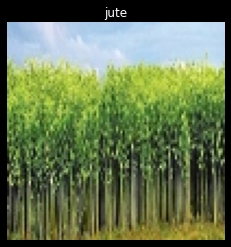

Prediction 482 rice


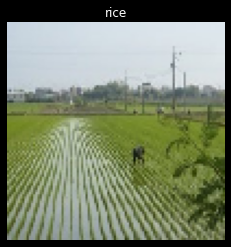

Prediction 518 sugarcane


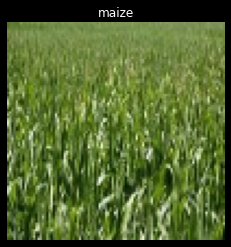

Prediction 527 jute


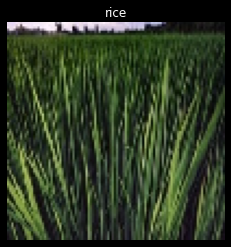

Prediction 537 maize


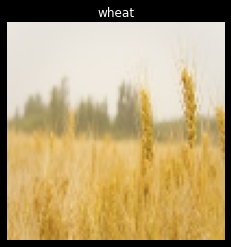

Prediction 547 rice


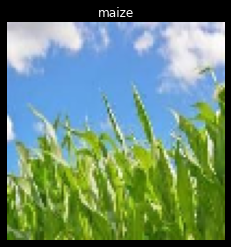

Prediction 553 rice
total misclassified images :  39


In [79]:
#misclassifications
outputs = model.predict(X)
count_mis = 0
for i in range(Y.shape[0]):
    if Y[i] != outputs[i]:
        count_mis+=1
        drawImg(X[i].reshape(100,100,3),Y[i])
        print("Prediction %d %s"%(i,label2img[outputs[i]]))
print("total misclassified images : ",count_mis)        